# Step 1: Our Stakeholder and the Business Problem.
# HGTV SHOW
-HGTV is launching a show based on homes in kings county. The goal of the show is to show homeowners what predictors lead to a higher listing price so the owner can sell and maximize profit.The goal is getting homes with good grades and base quality that may need a couple of alterations to maximize it's value. 
- 

# IMPORTING LIBRARIES 

In [29]:
#importing the necessary libraries for the project. 
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
import statsmodels
from statsmodels.formula.api import ols
from sklearn.model_selection import train_test_split
from sklearn.dummy import DummyRegressor
from statsmodels.tools.eval_measures import rmse
from statsmodels.api import qqplot
from scipy import stats
from sklearn.preprocessing import OneHotEncoder
from folium.plugins import FastMarkerCluster
import folium
from sklearn.metrics import r2_score
import branca.colormap as cm
from matplotlib import ticker

In [30]:
#loading in the data and making a pandas dataframe.
df = pd.read_csv('data/kc_house_data.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     19221 non-null  object 
 9   view           21534 non-null  object 
 10  condition      21597 non-null  object 
 11  grade          21597 non-null  object 
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  object 
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   17755 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

# EDA(EXPLORITORY DATA ANALYSIS)

In [6]:
#Exploring the columns and values.
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,NONE,...,7 Average,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,NO,NONE,...,7 Average,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,NO,NONE,...,6 Low Average,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,NO,NONE,...,7 Average,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,NO,NONE,...,8 Good,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503



-Exploring some low hanging data.
some standouts: Avaerage house in this county have 3 bedrooms and 2 bathrooms.
-Theres a hosue in the set that gas 33 bedrooms and 8 bathroom which will defiently be an outlier.
-Oldest house is dated to 1900. While he most recent hosue was built in 2015. 

In [6]:

df.describe()


,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.159700e+04,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,21597.000000,21597.000000,17755.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000
mean,4.580474e+09,5.402966e+05,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,1788.596842,1970.999676,83.636778,98077.951845,47.560093,-122.213982,1986.620318,12758.283512
std,2.876736e+09,3.673681e+05,0.926299,0.768984,918.106125,4.141264e+04,0.539683,827.759761,29.375234,399.946414,53.513072,0.138552,0.140724,685.230472,27274.441950
min,1.000102e+06,7.800000e+04,1.000000,0.500000,370.000000,5.200000e+02,1.000000,370.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,1190.000000,1951.000000,0.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,1560.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,2210.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,9410.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


Running a histogram of the dataframe. So visibily see the distribution. Apart from Latitude and Year Built. Most of the variables distrubte the right. 

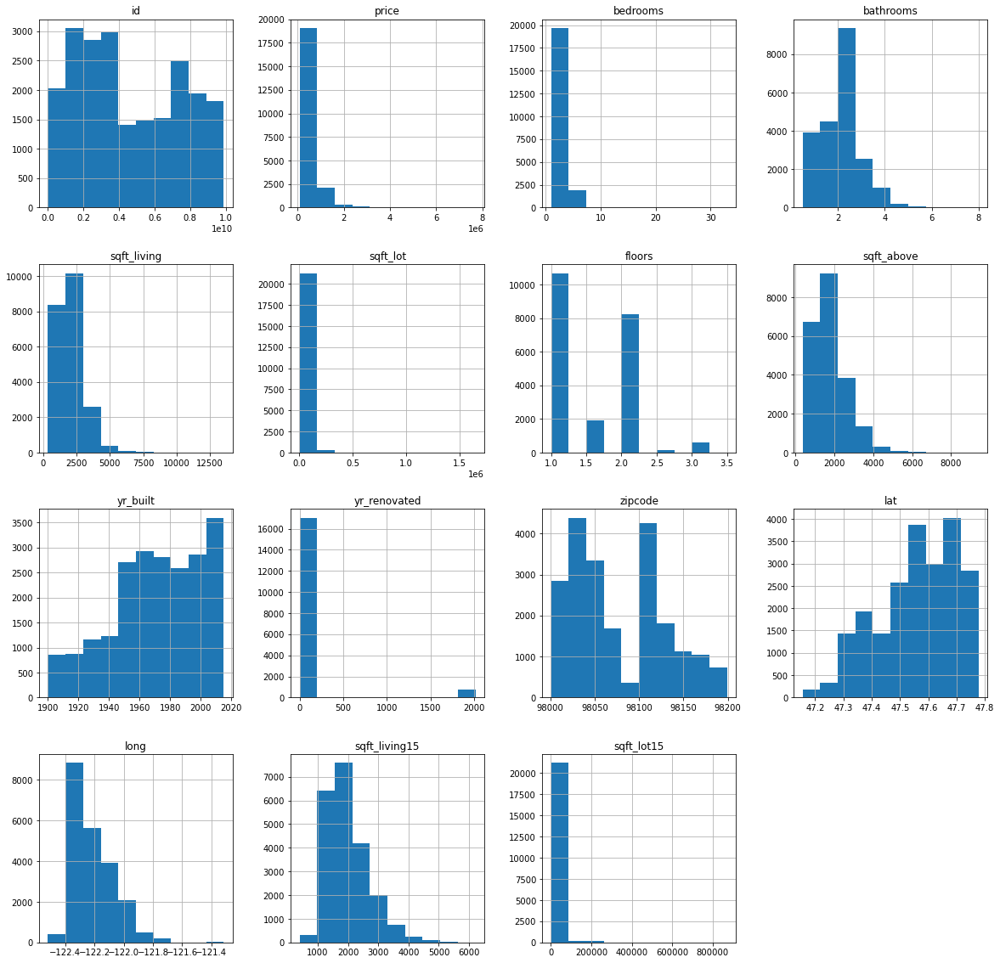

In [5]:
df.hist(figsize=(20,20)); 

-Dropping houses that are repeated. some houses are repeated if they had rennovations done.
-Filling in waterfront's NA values with 0 
-Dropping years renovated column because a large amount og

In [7]:
#exploring and filtering

df.drop_duplicates(subset='id',keep='first',inplace=True)
df['waterfront'].fillna(0, inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21420 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21420 non-null  int64  
 1   date           21420 non-null  object 
 2   price          21420 non-null  float64
 3   bedrooms       21420 non-null  int64  
 4   bathrooms      21420 non-null  float64
 5   sqft_living    21420 non-null  int64  
 6   sqft_lot       21420 non-null  int64  
 7   floors         21420 non-null  float64
 8   waterfront     21420 non-null  object 
 9   view           21357 non-null  object 
 10  condition      21420 non-null  object 
 11  grade          21420 non-null  object 
 12  sqft_above     21420 non-null  int64  
 13  sqft_basement  21420 non-null  object 
 14  yr_built       21420 non-null  int64  
 15  yr_renovated   17616 non-null  float64
 16  zipcode        21420 non-null  int64  
 17  lat            21420 non-null  float64
 18  long  

In [8]:
for column in list(df.columns):
    print(column, sum(df[column].isnull()))

id 0
date 0
price 0
bedrooms 0
bathrooms 0
sqft_living 0
sqft_lot 0
floors 0
waterfront 0
view 63
condition 0
grade 0
sqft_above 0
sqft_basement 0
yr_built 0
yr_renovated 3804
zipcode 0
lat 0
long 0
sqft_living15 0
sqft_lot15 0


# Pre Model Assumptions

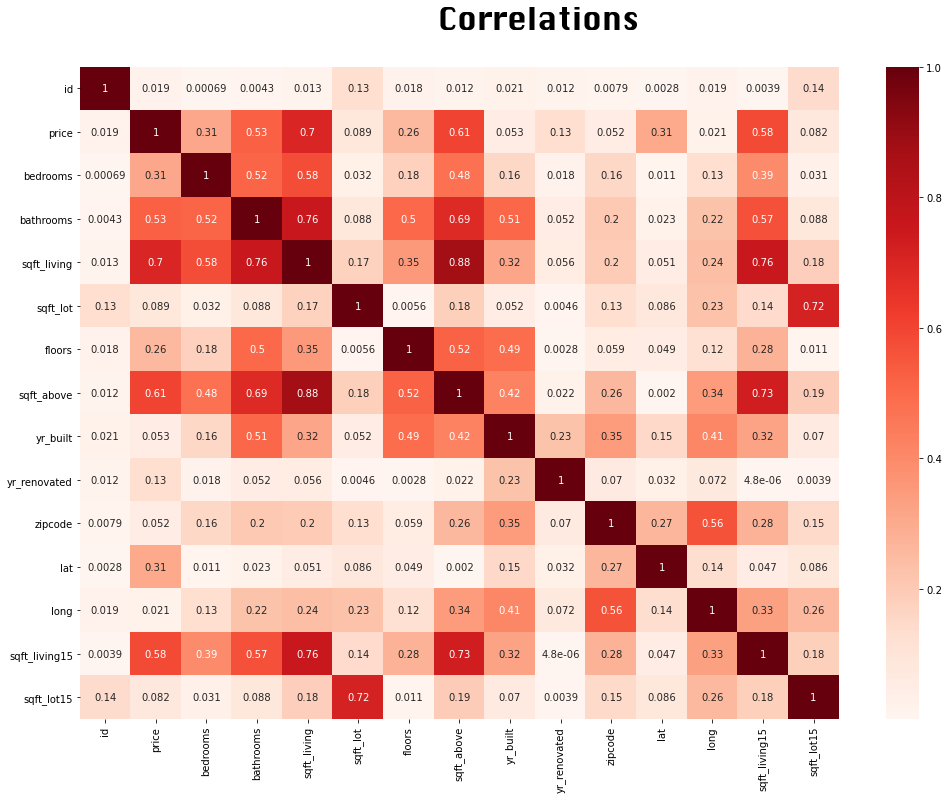

In [12]:
corr = df.corr().abs()
fig, ax=plt.subplots(figsize=(17,12))
fig.suptitle('Correlations', fontsize=30, y=.95, fontname='Silom')
heatmap = sns.heatmap(corr, cmap='Reds', annot=True)

In [13]:
features = []
correlations = []
for idx, correlation in corr['price'].T.iteritems():
    if correlation >= .30 and idx != 'price':
        features.append(idx)
        correlations.append(correlation)
corr_with_price = pd.DataFrame({'Correlations':correlations, 'Features': features})

Multicollinear_Features = []
Multicollinear_Corr = []
def check_multicollinearity(feature):
    for idx, correlation in corr[feature].T.iteritems():
        if correlation >= .80 and idx != feature:
            Multicollinear_Features.append([feature, idx])
            Multicollinear_Corr.append(correlation)
            
for feature in corr:
    check_multicollinearity(feature)
MC_df = pd.DataFrame({'Correlations':Multicollinear_Corr, 'Features': Multicollinear_Features})
print('Multicollinear Features')
display(MC_df)
print('Correlations with Price')
display(MC_df)

Multicollinear Features


,Correlations,Features
0,0.876533,"[sqft_living, sqft_above]"
1,0.876533,"[sqft_above, sqft_living]"


Correlations with Price


,Correlations,Features
0,0.876533,"[sqft_living, sqft_above]"
1,0.876533,"[sqft_above, sqft_living]"


## Graphs to be added to presentation and variables to add to target price

The first graph we looked at is view and price since our bussiness problem is to add to value to lower quality houses. View is added value on the houses maybe there's correlation with price

/Users/olamideholayinka/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'House View and Price')

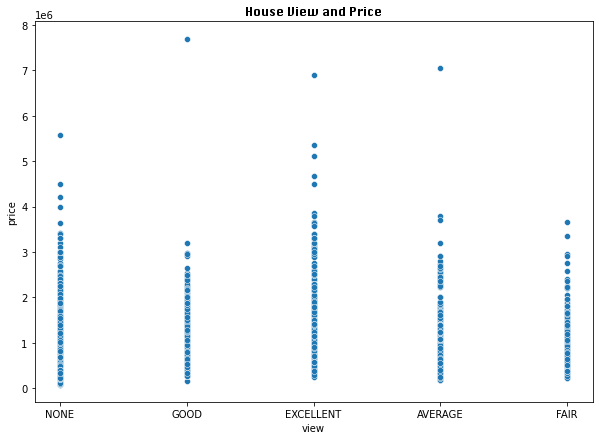

In [14]:
plt.figure(figsize=(10,7))
sns.scatterplot(df['view'], df['price'])
plt.title('House View and Price', fontsize=12, fontname='silom')

We see there is a correlation between price and having a view might be worth adding to our final model

In [31]:
grade_order = ['3 Poor', '4 Low', '5 Fair', '6 Low Average', '7 Average', '8 Good', '9 Better', '10 Very Good',  '11 Excellent', '12 Luxury', '13 Mansion']
#to make the order in the graph out put in order from trend we need to order from poor to mansion 

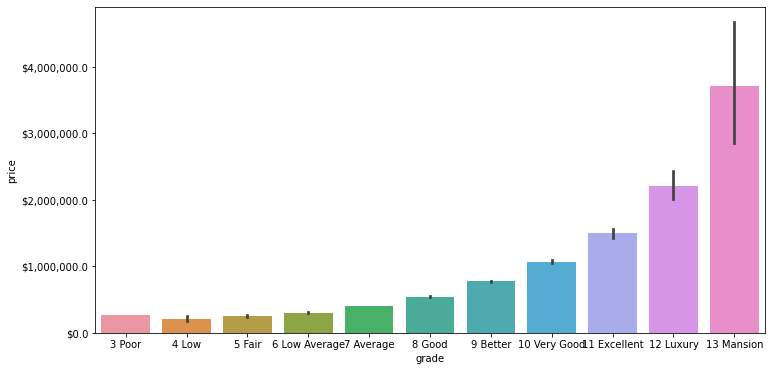

In [32]:
plt.figure(figsize=(12,6))
sns.barplot(x='grade', y='price', data=df , order=grade_order)
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('${x:,}'))
plt.show()

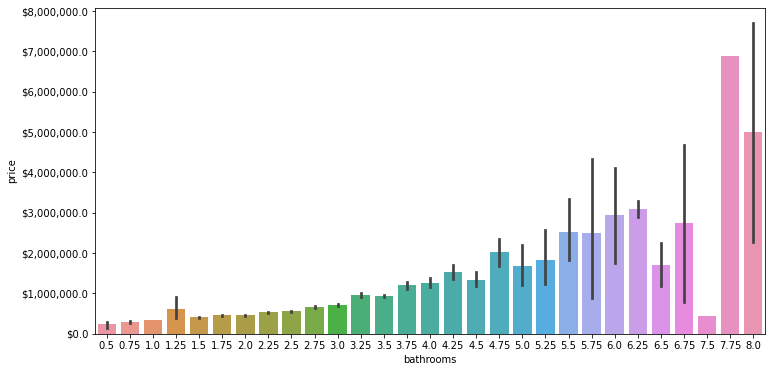

In [9]:
plt.figure(figsize=(12,6))
sns.barplot(x='bathrooms', y='price', data=df)
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('${x:,}'))
plt.show()

need to bin bathrooms

In [26]:
def get_center_latlong(df):
    centerlat = (df['lat'].max() + df['lat'].min()) / 2
    centerlong =  (df['long'].max() + df['long'].min()) / 2
    return centerlat, centerlong

In [27]:
center = get_center_latlong(df)


In [28]:
colormap = cm.LinearColormap(colors=['darkblue', 'orange', 'yellow', 'lightyellow', 'snow'], vmin=df['sqft_living'].min(), vmax=df['sqft_living'].max())


sqft_map = folium.Map(location=center, zoom_start=10)
for i in range(len(df)):
    folium.Circle(
    location=[df.iloc[i]['lat'], df.iloc[i]['long']],
        radius=10,
        fill=True,
        color=colormap(df.iloc[i]['sqft_living']),
        fill_opacity=0.2).add_to(sqft_map)
    
sqft_map.add_child(colormap)

In [35]:
df = df[(df["bathrooms"] == 7.5)]
df #

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
8537,424049043,8/11/2014,450000.0,9,7.5,4050,6504,2.0,NO,NONE,...,7 Average,4050,0.0,1996,0.0,98144,47.5923,-122.301,1448,3866


In [37]:
df.sqft_living.describe() #

count       1.0
mean     4050.0
std         NaN
min      4050.0
25%      4050.0
50%      4050.0
75%      4050.0
max      4050.0
Name: sqft_living, dtype: float64

In [ ]:
# CHECKING FOR LINEARITY 


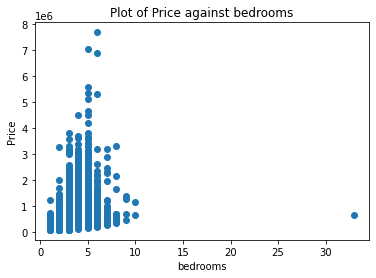

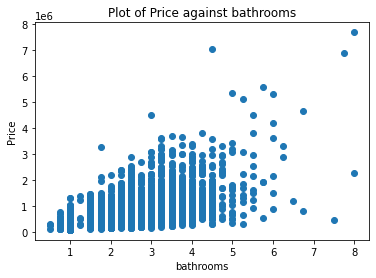

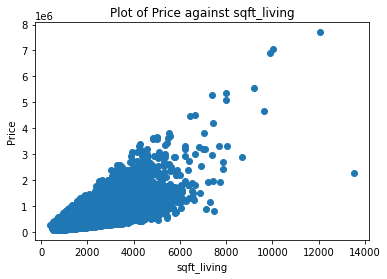

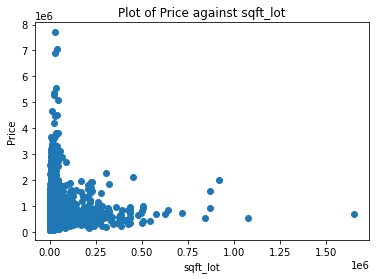

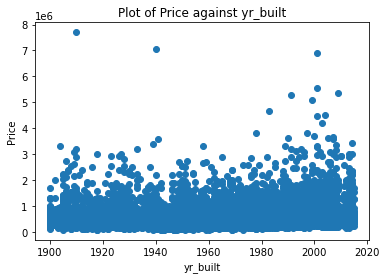

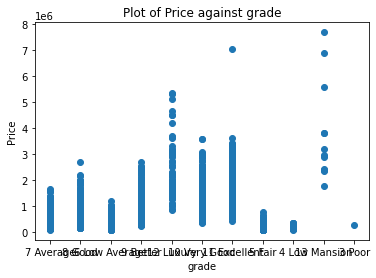

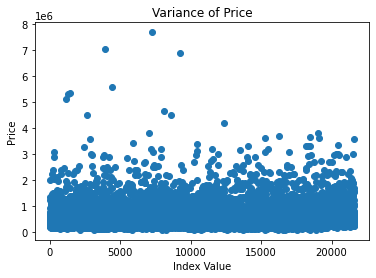

In [22]:
features = X_train.columns

for x in features:
    plt.scatter(X_train[x], y_train)
    plt.title(f'Plot of Price against {x}')
    plt.xlabel(x)
    plt.ylabel('Price')
    plt.show()
    
# also plot sales against itself
plt.scatter(y_train.index, y_train)
plt.hlines(y_train.mean(), 0, 200)
plt.xlabel('Index Value')
plt.ylabel('Price')
plt.title('Variance of Price')
plt.show()

In [23]:
train_df = pd.concat([X_train, y_train], axis =1)

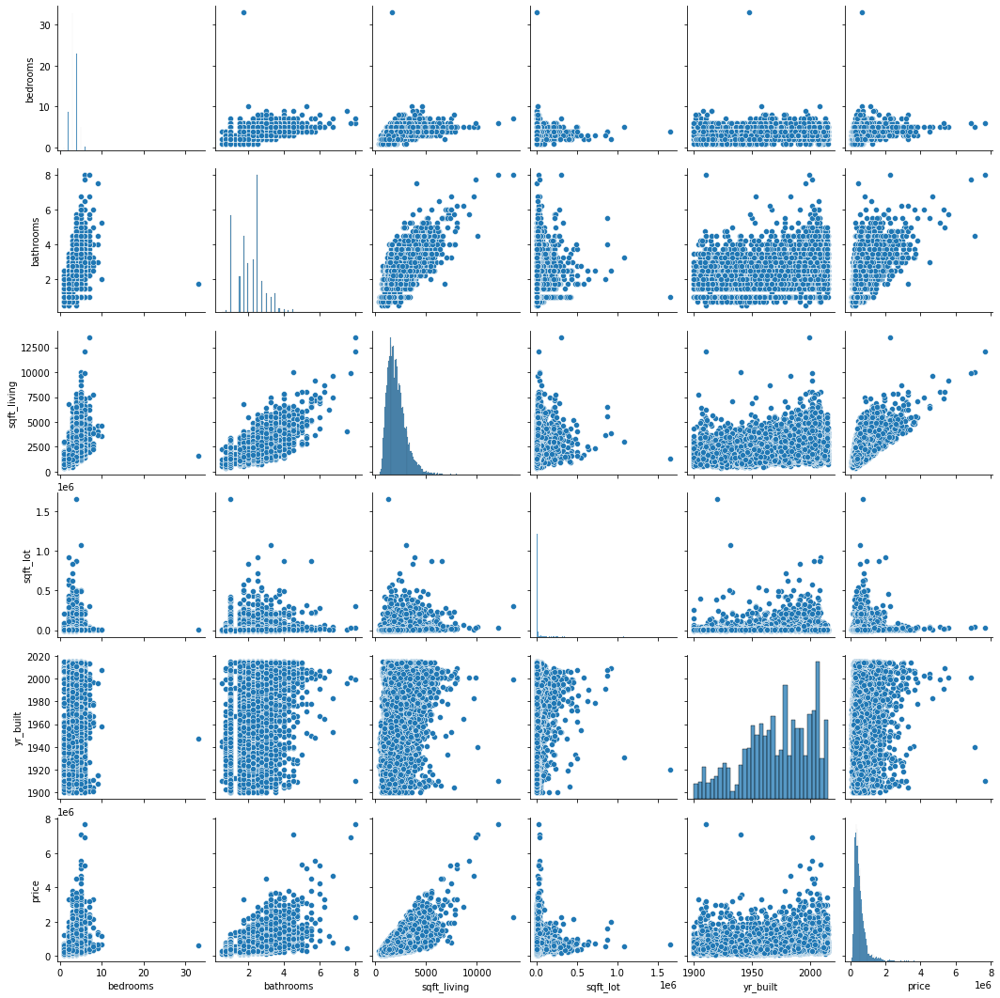

In [24]:
sns.pairplot(train_df)
plt.show()

# STEP 3 TRAIN TEST SPLIT

In [21]:
y = df.price #final model needs to be at the end 
X = df[['bedrooms', 'bathrooms', 'sqft_living','sqft_lot','yr_built','grade' ]]
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42)

In [ ]:
y = housing_df.price
X = housing_df[['sqft_living']] #simple model before final
X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    y,
                                                    test_size=None,
                                                    random_state=42)

In [ ]:
y = king_df.price #simple model before final
X = king_df[['bathrooms', 'bedrooms', 'sqft_lot', 'floors', 'sqft_living']]
X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    y,
                                                    test_size=None,
                                                    random_state=42
)

# STEP 4 ONE HOT ENCODE CATEGORICAL VARIABLE

In [ ]:
#grade

In [25]:
ohe = OneHotEncoder()
ohe.fit_transform(X_train)

<17136x9494 sparse matrix of type '<class 'numpy.float64'>'
	with 102816 stored elements in Compressed Sparse Row format>

In [26]:
train_df.corr()

,bedrooms,bathrooms,sqft_living,sqft_lot,yr_built,price
bedrooms,1.000000,0.512126,0.575100,0.040754,0.152713,0.308335
bathrooms,0.512126,1.000000,0.756116,0.091503,0.503744,0.526030
sqft_living,0.575100,0.756116,1.000000,0.180099,0.314592,0.702331
sqft_lot,0.040754,0.091503,0.180099,1.000000,0.050806,0.092713
yr_built,0.152713,0.503744,0.314592,0.050806,1.000000,0.052383
price,0.308335,0.526030,0.702331,0.092713,0.052383,1.000000


# STEP 5 CREATING DUMMY BASELINE

In [27]:
#Dummy Regressor for the baseline. DUMMY IS ONLY APPLIED ON TRAINING SET
dummy_regr = DummyRegressor(strategy='mean')
dummy_regr.fit(X_train, y_train)
dummy_regr.predict(X_train)

array([542950.3173436, 542950.3173436, 542950.3173436, ...,
       542950.3173436, 542950.3173436, 542950.3173436])

In [28]:
dummy_regr.score(X_train, y_train)# the R score is zero.  The mean of Y explains 0% of the variation of sales price. 

0.0

In [ ]:
y_train.shape
y_train

# FINAL MODEL FOR PRESENTATION

In [ ]:
# NOW CREATE FIRST SIMPLE MODEL THAT DOES BETTER THAN DUMMY REGRESSOR MEAN.
#EXAMPLES; RECURSIVE FEATURE ELIMINATION. LOOK AT HIGH CORRELATIONS VARIABLES TO Y.

#MODEL 1 

In [30]:
y = df.price
X = df[['bedrooms', 'bathrooms', 'sqft_living','sqft_lot','yr_built','grade', 'floors' ]]
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42) 

In [31]:
dummy_regr = DummyRegressor(strategy='mean')
dummy_regr.fit(X_train, y_train)
dummy_regr.predict(X_train)

array([542950.3173436, 542950.3173436, 542950.3173436, ...,
       542950.3173436, 542950.3173436, 542950.3173436])

In [32]:
dummy_regr.score(X_train, y_train)

0.0

In [33]:
grade_trial = pd.DataFrame()
grade_test = pd.DataFrame()

In [34]:
ohe = OneHotEncoder(sparse=False, handle_unknown='ignore')
grade_trial['grade'] = X_train['grade']
grade_trial['ID'] = len(X_train.values)
ohe_data = pd.DataFrame(ohe.fit_transform(grade_trial)) 
#grade_trial
ohe_data.columns = ohe.get_feature_names(['grade', 'ID'])
ohe_data = ohe_data.drop('ID_17136', axis=1)
#ohe_data

grade_test['grade'] = X_test['grade']
grade_test['ID'] = len(X_test.values)
ohe_test = pd.DataFrame(ohe.transform(grade_test))
ohe_test.columns = ohe.get_feature_names(['grade', 'ID'])
ohe_test = ohe_test.drop('ID_17136', axis=1)

In [35]:
np.random.seed(42)

y = df.price
X = df[['bedrooms', 'bathrooms', 'sqft_living','sqft_lot','yr_built','grade', 'floors' ]]

# Train test split with random_state=42 and test_size=0.2

X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.2,
                                                    random_state=42)

# Scale appropriately on TRAINING DATA 

ss = StandardScaler()
ss.fit(X_train.drop('grade', axis=1))
Testpreds = ss.transform(X_test.drop('grade', axis=1))
X_preds_st_scaled = ss.transform(X_train.drop('grade', axis=1))

lr = LinearRegression()

# fit and score the model (checkout the test set if there is time)
lr.fit(X_preds_st_scaled, y_train)
lr.coef_
lr.score(X_preds_st_scaled, y_train)

0.5547264615853337

In [36]:
combined_x = ohe_data.join(pd.DataFrame(X_preds_st_scaled))
combined_test = ohe_test.join(pd.DataFrame(Testpreds))

In [37]:
type(combined_test)

pandas.core.frame.DataFrame

In [38]:
lr = LinearRegression()

# fit and score the model (checkout the test set if there is time)
lr.fit(combined_x.values, y_train)
lr.coef_
lr.score(combined_x.values, y_train)

0.6479566533507228

In [39]:
model1 = lr.predict(combined_test.values)
lr.coef_
lr.score(combined_test.values, y_test)

0.6313406870043061

In [40]:
def sk_metrics(y, model):
    from sklearn.metrics import mean_squared_error, mean_absolute_error

    print("Metrics:")
    # R2
    print(f"R2: {r2_score(y, model):.3f}")
    # MAE
    print(f"Mean Absolute Error: {mean_absolute_error(y, model):.3f}")
    # MSE
    print(f"Mean Squared Error: {mean_squared_error(y, model):.3f}")
    # RMSE - just MSE but set squared=False
    print(f"Root Mean Squared Error: {mean_squared_error(y, model, squared=False):.3f}")
    return

In [41]:
sk_metrics(y_test, model1)

Metrics:
R2: 0.631
Mean Absolute Error: 136819.122
Mean Squared Error: 44643315242.166
Root Mean Squared Error: 211289.648


In [42]:
display(X_train.head())
display(X_test.head())


,bedrooms,bathrooms,sqft_living,sqft_lot,yr_built,grade,floors
13634,4,2.50,2240,4616,2001,7 Average,2.0
13631,2,2.25,2470,7658,1954,8 Good,1.0
5717,5,3.50,3530,218472,1999,7 Average,2.0
15431,4,1.50,1580,10230,1945,6 Low Average,1.0
17294,4,2.50,2070,10244,1969,8 Good,1.0


,bedrooms,bathrooms,sqft_living,sqft_lot,yr_built,grade,floors
6132,3,1.00,1020,6000,1900,7 Average,1.5
8993,3,1.75,1620,5500,1950,7 Average,1.0
559,4,2.50,2050,10271,1998,7 Average,2.0
11931,3,2.50,2510,5186,2001,7 Average,2.0
15176,2,2.00,1390,12530,1959,8 Good,1.0


In [43]:
# SECOND MODEL .R squared is lower than our first. 
#all of this down needs to be before the final model 

In [64]:
Model_2 = ols(formula="price ~bathrooms + bedrooms", data=df).fit()
Model_2.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.279
Model:                            OLS   Adj. R-squared:                  0.279
Method:                 Least Squares   F-statistic:                     4142.
Date:                Thu, 17 Feb 2022   Prob (F-statistic):               0.00
Time:                        15:32:08   Log-Likelihood:            -3.0140e+05
No. Observations:               21420   AIC:                         6.028e+05
Df Residuals:                   21417   BIC:                         6.028e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -3.547e+04   8361.541     -4.242      0.000   -5.19e+04   -1.91e+04
bathrooms    2.39e+05   3240.812     73.754      0.000    2.33e+05    2.45e+05
bedrooms     2.07e+04   2692.095      7.691      0.000    1.54e+04     2.6e+04
==============================================================================
Omnibus:                    17197.290   Durbin-Watson:                   1.969
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           897026.537
Skew:                           3.474   Prob(JB):                         0.00
Kurtosis:                      33.932   Cond. No.                         17.0
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [65]:
Model_3 = ols(formula="price ~sqft_living + sqft_living15 + sqft_lot ", data=df).fit()
Model_3.summary()
#better r squared than our second but not better than our first

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.501
Model:                            OLS   Adj. R-squared:                  0.500
Method:                 Least Squares   F-statistic:                     7155.
Date:                Thu, 17 Feb 2022   Prob (F-statistic):               0.00
Time:                        15:32:08   Log-Likelihood:            -2.9747e+05
No. Observations:               21420   AIC:                         5.949e+05
Df Residuals:                   21416   BIC:                         5.950e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept     -1.004e+05   5456.168    -18.400      0.000   -1.11e+05   -8.97e+04
sqft_living     245.0885      2.970     82.528      0.000     239.268     250.909
sqft_living15    68.0150      3.962     17.168      0.000      60.250      75.780
sqft_lot         -0.3078      0.043     -7.085      0.000      -0.393      -0.223
==============================================================================
Omnibus:                    15375.814   Durbin-Watson:                   1.989
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           666369.950
Skew:                           2.967   Prob(JB):                         0.00
Kurtosis:                      29.672   Cond. No.                     1.36e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.36e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [66]:
Model_4 = ols(formula="price ~sqft_living + sqft_living15", data=df).fit()
Model_4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.499
Model:                            OLS   Adj. R-squared:                  0.499
Method:                 Least Squares   F-statistic:                 1.068e+04
Date:                Thu, 17 Feb 2022   Prob (F-statistic):               0.00
Time:                        15:32:09   Log-Likelihood:            -2.9749e+05
No. Observations:               21420   AIC:                         5.950e+05
Df Residuals:                   21417   BIC:                         5.950e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept     -9.958e+04   5461.213    -18.234      0.000    -1.1e+05   -8.89e+04
sqft_living     243.0141      2.959     82.136      0.000     237.215     248.813
sqft_living15    67.4359      3.965     17.006      0.000      59.663      75.208
==============================================================================
Omnibus:                    15441.551   Durbin-Watson:                   1.989
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           675536.703
Skew:                           2.984   Prob(JB):                         0.00
Kurtosis:                      29.857   Cond. No.                     9.43e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 9.43e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

# POST MODEL ANALYSIS 